# Analysing topics with hSBM

In order to explore the content of the collected Wikipedia pages, we deploy a  hierarchical stochastic block model (hSBM). The model is used to identify prevalent topics in a text corpora, and it relies on integration of  teqniques used for community detection in networks (Gerlach et al. 2018). HSBM has proven to perform better than the more widely used latent Dirichlet allocation (LDA). Topics can be identified by the HSBM by representing the text corpora as a bipartite network in which nodes are documents and words, and the weight of the edges connecting nodes are determined by word-occurrences in each document. The model automatically detects the relevant number of topics and makes a hierarchical clustering of nodes (ibid.).

We were only able to run the hSBM in Google Colab. The code is attached and it can also be found through the link below. Through the hSBM we identifyied e list of topics and corresponding probabilities for each document to belong to a certain topic. We stored this information in a dataframe to be able to further analyse it in this notebook.

https://colab.research.google.com/drive/10_H2VPqhq69gVBz0nWEyC8aqVadAq9lc?usp=sharing

In [225]:
import json
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import networkx as nx
from networkx.algorithms import bipartite
import netwulf as nw
from IPython.display import Image

In [226]:
# We read the dataframes with data from HSBM 
topics=pd.read_csv('HSBM_topics_03.12.csv')
topics.drop('Unnamed: 0', axis = 'columns', inplace = True)
HSBM_probs=pd.read_csv('HSBM_probs_03.12.csv')
HSBM_probs.drop('Unnamed: 0', axis = 'columns', inplace = True)

**Plotting result of HSBM** <br>
We plot the word-document bipartite network generated thought hSBM. Document-nodes are on the left, and word-nodes are on the right. Colors correspond to the different groups. The nodes of words and documents are grouped on multiple levels.On the highest level (in the center of the graph) all nodes belong to the same group, on the second highest level the network is splot into word- and document-nodes. We are interested in the word-groups as these correspond to topics of the documents. The SBM has a hierarchical structure which implies that topics at the lowest levels (far to the right) contain more granular information about the content of the documents, whereas, topics at higher levels are clusters of the lower level topics and, thus, more aggregate (ref). 

The hSBM generates 393 topics at Level 0, 60 topics at Level 1, 9 topics at Level 2, 2 topics at Level 3, and 1 topic at Level 4. We choose to work with topics at level 1 which we deem to be the most appropriate level to examine as the topics appear to be reasonably coherent and manageable to manually select from. A list of topics at all levels is attached in Appendix X.

The documents on the left side are sorted such that the disciplines appear alphabethically such that anthropologists are the first nodes and the last are sociologists. The number of documents vary within each discipline, and thus we show the order in the table below. From the graph below we can sense how the document-nodes seem to cluster in what might correspond to disciplinary groupings. This is sespecially true for the cluster document nodes in the bottom which could indicate a sociology group.

In [227]:
# Showing the order and number of documents for each discipline as they appear in the graph below. 
pd.DataFrame(HSBM_probs.groupby(['discipline']).size())

,0
discipline,
anth,144
eco,825
multiple,86
pol,233
psy,301
soc,511


                 Bipartite network of documents and words


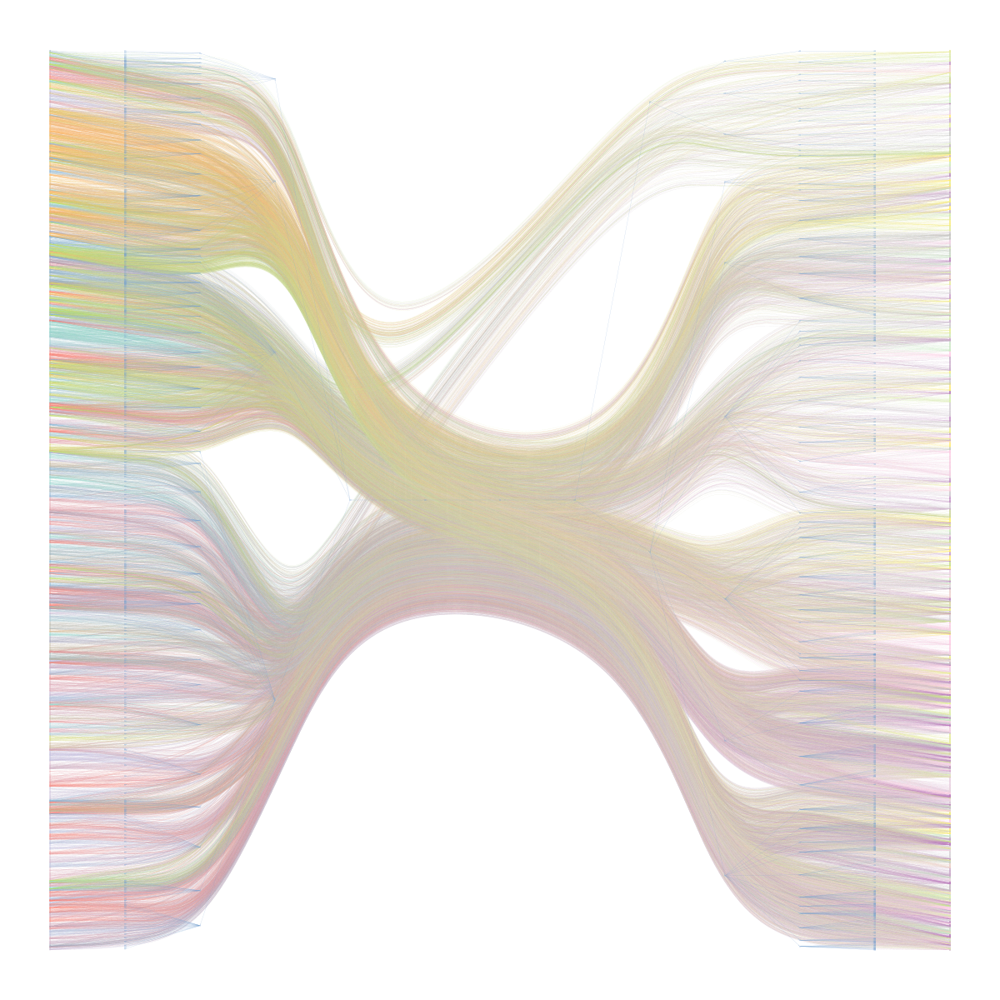

In [228]:
# We show the image of the bipartite network generated through th hSBM. 
print('                 Bipartite network of documents and words')
Image(filename = "hSBM_Topicmodel.png", width=600, height=600)


**Selecting relevant topics** <br>
The full list of topics generated at Level 1 appear in the dataframe below  

In [8]:
# Printing all rows in the dataframe of topics 
pd.set_option("display.max_rows", None, "display.max_columns", None)
topics

,Topic,Topic_words,Probability_of_word_in_topic
0,0,model,0.096069
1,0,jstor,0.041438
2,0,mathematics,0.032824
3,0,game,0.032189
4,0,mathematical,0.029922
5,0,equilibrium,0.027565
6,0,statistic,0.023213
7,0,statistical,0.022034
8,0,design,0.019314
9,0,assumption,0.018679


For each of the generated topics, we examine the 10 most probable words in order to select a subset of topics which we assess to be the most interesting to further examine. We draw on a heuristic approach which implies that we select topics that we assess to be semantically coherent and exclusive. Furthermore, we only select topics that we assess to be related to the content of the theoretical contributions of the researchers and we discard topics that appear to be related to academic prestige, timely relevans (topics consisting only of years e.g. Topic 4 and 7), and nationality (topics consisting of city names and words in non-English languages e.g. Topic 33 and 34). We select a subset of 29 topics which we give appropriate descriptive names.

In [241]:
# The final selected topics appear from the dictionary below with acribed names
# 4,7 is only years 6 are only months 
# 2,3,10,22 both have to do with accademic prestige
# 33 is only french, 34 is german

topic_dict={'0':'Mathematical Models',
            '8':'Value interests',
            '9':'Society and history',
            '17':'Philosophy',
            '18':'International Relations',
            '19':'Domestic Politics',
            '20':'Justice',
            '24':'Cultural Sociology',
            '25':'The Mind of the Individual',
            '28':'Human actions',
            '29':'Psychoanalysis',
            '30':'Stories of minorities',
            '31': 'Science Studies',
            '35': 'Capitalism',
            '37':'War and Conflicts',
            '38':'Language and Religion',
            '39':'Power relations and Class',
            '43':'Race',
            '44':'Economics',
            '45':'Child/mother relations',
            '47':'Global relations -Asia',
            '49':'Equal Rights',
            '51':'Financial Polics',
            '54':'Democratic Policy Making',
            '55':'Cognition and behaviour',
            '56':'Gender',
            '57':'Marxism',
            '59':'Psychology'}      

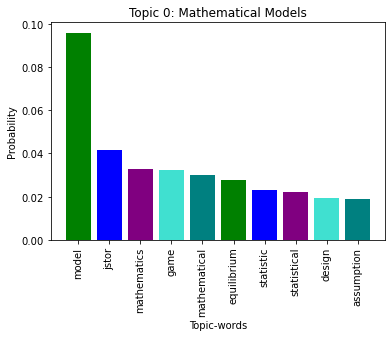

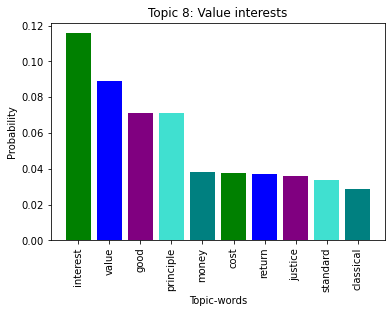

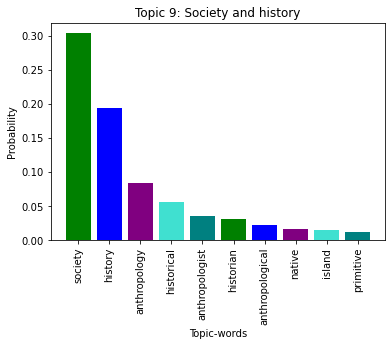

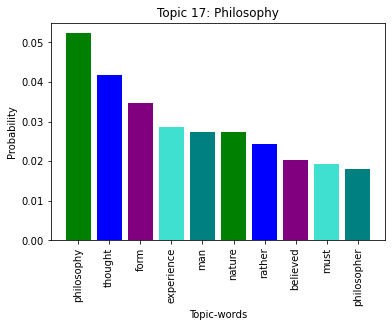

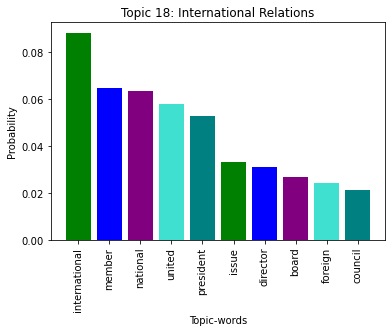

...

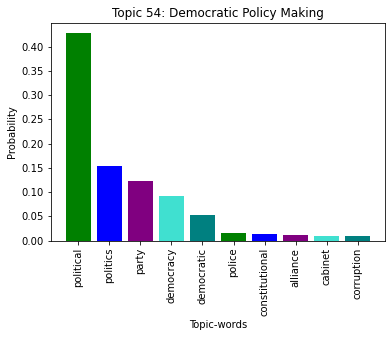

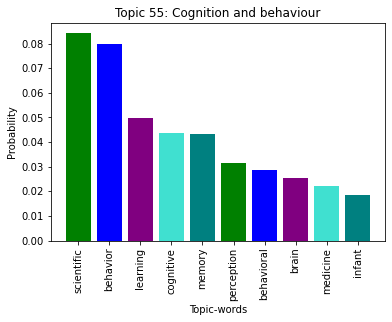

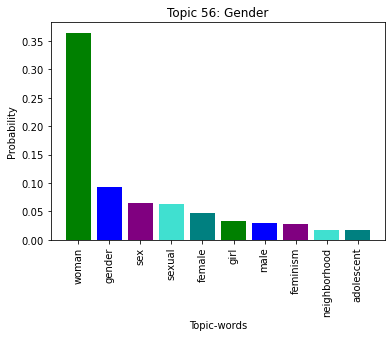

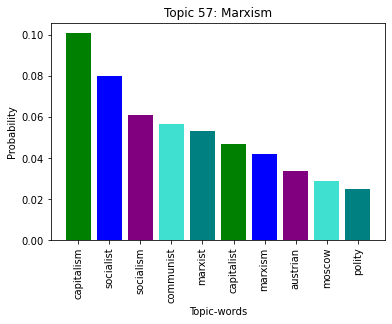

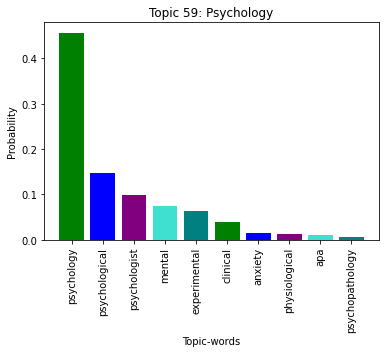

In [232]:
''' We create a barplot of the most important words within each of the selected topics '''

# We define the colors
color= ['green','blue','purple','turquoise','teal']

for i,t in topic_dict.items():
    
# We use the keys and values from the topic_dict to extract words and probabilities from the topic dataframe. 
# Words and word probabilities are then showed in a bar plot for each topic
    plt.bar(list(topics[topics['Topic']==int(i)]['Topic_words']),
            list(topics[topics['Topic']==int(i)]['Probability_of_word_in_topic']),color=color)
    plt.title('Topic {}: {}'.format(i,t))
    plt.xlabel('Topic-words')
    plt.ylabel('Probability')
    plt.xticks(rotation=90)
    plt.show()

# Topics within disciplines and communities 

**Examining distribution of topics by discipline** <br>
After having examined and selcted a subset of topics generated by the hSBM, we move on to find the distribution of each topic within the disciplines. By doing this, we want to find out whether the social scientists across different disciplines deal with the same topics or if their discipline bind them to certain topics. 

In [244]:
# We subset the dataframe of topic probabilities for each document to contain only the selected topics
HSBM_probs_topics=HSBM_probs[['name','discipline','community','text']+list(topic_dict.keys())]

# We rename the topics to the ascribed titles 
HSBM_probs_topics=HSBM_probs_topics.rename(columns=topic_dict)

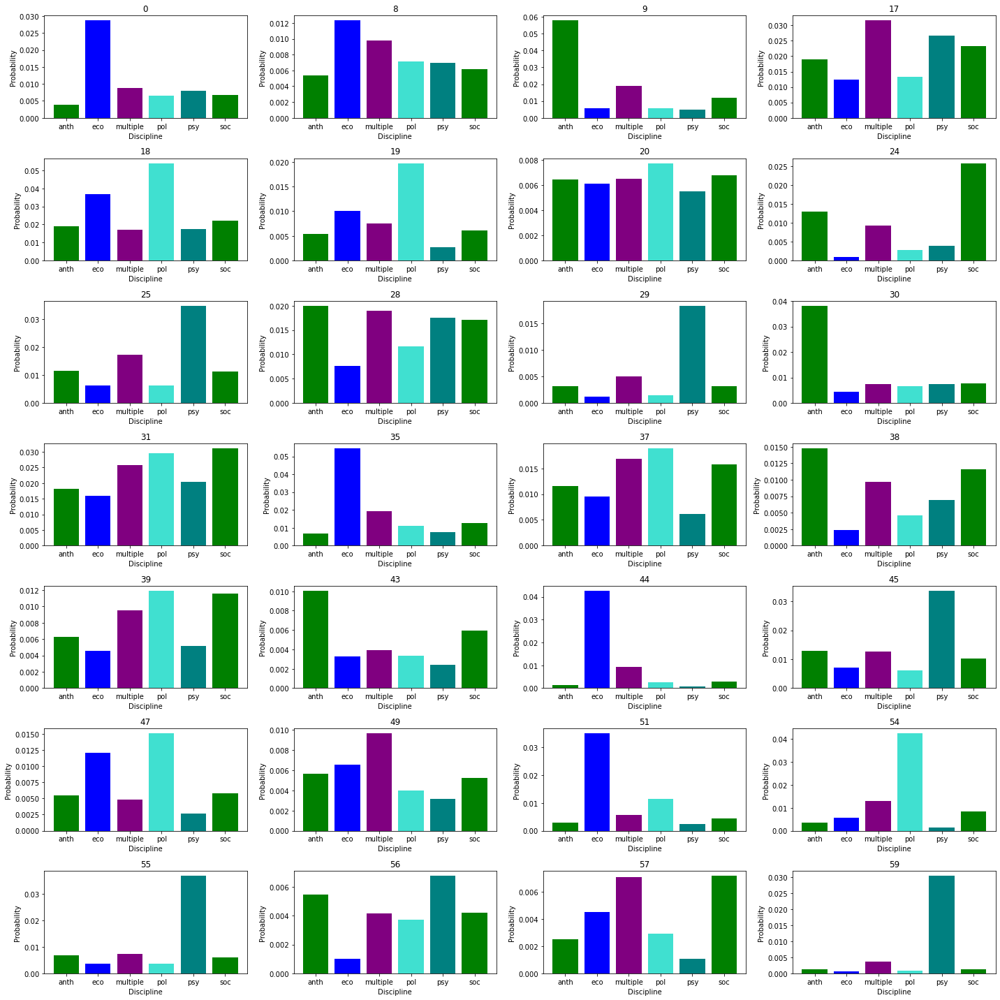

In [235]:
'''Showing distribution of topic for all disciplines'''

# We group all document by the disciplines, they belong to. 
HSBM_probs_discipline=HSBM_probs_topics.groupby('discipline',as_index=False).mean()

# We make subplots 
fig, ax = plt.subplots(7, 4, figsize=(20, 20))

# We loop over each topic 
for i,topic in enumerate(HSBM_probs_discipline.columns[2:]):
    if i<4:
        axis=ax[0,i]        
    if i>=4 and i<8:
        i = i-4
        axis=ax[1,i]
    if i>=8 and i<12:
        i = i-8
        axis=ax[2,i]
    if i>=12 and i<16:
        i=i-12
        axis=ax[3,i]        
    if i>=16 and i<20:
        i =i-16
        axis=ax[4,i]
    if i>=20 and i<24:
        i=i-20
        axis=ax[5,i]        
    if i>=24:
        i =i-24
        axis=ax[6,i]
        
    # Creating bar plot for each topic 
    axis.bar(HSBM_probs_discipline.discipline,HSBM_probs_discipline[topic],color=color)
    axis.set_title(topic)
    axis.set_xlabel('Discipline')
    axis.set_ylabel('Probability')
    fig.tight_layout()

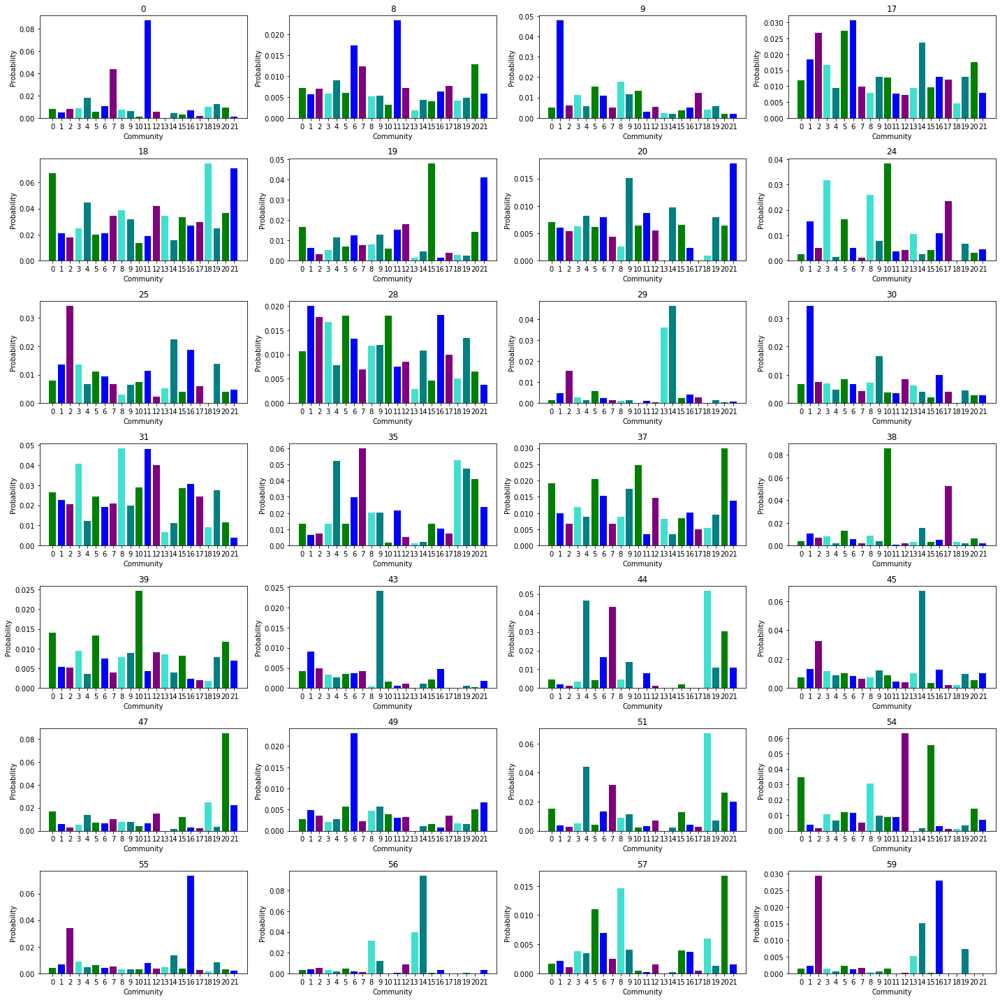

In [236]:
  '''Showing distribution of topic for all disciplines'''

# We group all document by the communities,we have identified. 
HSBM_probs_community=HSBM_probs_topics.groupby('community',as_index=False).mean()

# We make subplots 
fig, ax = plt.subplots(7, 4, figsize=(20,20))

# We loop over each topic 
for i,topic in enumerate(HSBM_probs_community.columns[1:]):
    if i<4:
        axis=ax[0,i]        
    if i>=4 and i<8:
        i = i-4
        axis=ax[1,i]
    if i>=8 and i<12:
        i = i-8
        axis=ax[2,i]
    if i>=12 and i<16:
        i=i-12
        axis=ax[3,i]        
    if i>=16 and i<20:
        i =i-16
        axis=ax[4,i]
    if i>=20 and i<24:
        i=i-20
        axis=ax[5,i]        
    if i>=24:
        i =i-24
        axis=ax[6,i]
        
    # Creating bar plot for each topic 
    axis.bar(HSBM_probs_community.community,HSBM_probs_community[topic],color=color)
    axis.set_title(topic)
    axis.set_xlabel('Community')
    axis.set_ylabel('Probability')
    axis.set_xticks(HSBM_probs_community.community)
    fig.tight_layout()

**[ Comments about the above ]**

In [240]:
HSBM_probs_topics

,name,discipline,community,text,0,8,9,17,18,19,20,24,25,28,29,30,31,35,37,38,39,43,44,45,47,49,51,54,55,56,57,59
0,A. H. J. Prins,anth,1,"['adriaan', 'hendrik', 'johan', 'generally', '...",0.010558,0.012066,0.110106,0.009050,0.030166,0.016591,0.009050,0.018100,0.015083,0.019608,0.010558,0.028658,0.015083,0.003017,0.013575,0.010558,0.003017,0.007541,0.001508,0.006033,0.004525,0.001508,0.003017,0.001508,0.000000,0.000000,0.000000,0.000000
1,Adam Kuper,anth,1,"['adam', 'jonathan', 'born', 'december', '1941...",0.000000,0.003448,0.100000,0.006897,0.010345,0.003448,0.006897,0.020690,0.006897,0.013793,0.000000,0.013793,0.020690,0.013793,0.003448,0.003448,0.000000,0.013793,0.003448,0.006897,0.003448,0.003448,0.003448,0.000000,0.000000,0.000000,0.000000,0.000000
2,Alan Macfarlane,anth,6,"['alan', 'donald', 'born', 'december', '1941',...",0.000908,0.004541,0.043597,0.019982,0.009083,0.002725,0.009083,0.006358,0.006358,0.019074,0.000000,0.007266,0.018165,0.009991,0.006358,0.006358,0.000000,0.006358,0.002725,0.015441,0.026340,0.001817,0.001817,0.001817,0.001817,0.001817,0.006358,0.000000
3,Albert Buell Lewis,anth,1,"['june', '1867', '–', 'october', '1940', 'firs...",0.010782,0.001348,0.090296,0.013477,0.004043,0.000000,0.005391,0.010782,0.010782,0.018868,0.002695,0.080863,0.006739,0.005391,0.002695,0.005391,0.001348,0.002695,0.000000,0.014825,0.001348,0.002695,0.001348,0.000000,0.004043,0.000000,0.001348,0.000000
4,Alfred Gell,anth,1,"['alfred', 'antony', 'francis', 'june', '1945'...",0.003145,0.006289,0.069182,0.015723,0.000000,0.000000,0.000000,0.012579,0.022013,0.044025,0.000000,0.012579,0.018868,0.006289,0.003145,0.100629,0.003145,0.006289,0.009434,0.015723,0.009434,0.003145,0.000000,0.000000,0.006289,0.000000,0.000000,0.000000
5,Anthony F. C. Wallace,anth,1,"['anthony', 'francis', 'clarke', 'april', '192...",0.001590,0.001590,0.077901,0.011129,0.030207,0.006359,0.000000,0.011129,0.012719,0.014308,0.001590,0.025437,0.020668,0.004769,0.009539,0.014308,0.001590,0.011129,0.001590,0.006359,0.001590,0.000000,0.000000,0.000000,0.004769,0.001590,0.001590,0.007949
6,Anton Blok,anth,1,"['born', '1935', 'amsterdam', 'dutch', 'anthro...",0.000000,0.018692,0.018692,0.000000,0.009346,0.000000,0.009346,0.009346,0.018692,0.009346,0.018692,0.000000,0.009346,0.009346,0.018692,0.018692,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.009346,0.000000,0.000000,0.009346,0.000000
7,Arthur Maurice Hocart,anth,5,"['april', '1883', 'etterbeek', 'belgium', '–',...",0.003876,0.001938,0.100775,0.025194,0.003876,0.005814,0.005814,0.009690,0.003876,0.015504,0.001938,0.027132,0.011628,0.001938,0.009690,0.005814,0.001938,0.011628,0.000000,0.015504,0.001938,0.009690,0.005814,0.001938,0.005814,0.000000,0.003876,0.001938
8,Arturo Escobar (anthropologist),anth,5,"['born', '1952', 'colombianamerican', 'anthrop...",0.004637,0.004637,0.021638,0.006182,0.034003,0.007728,0.003091,0.010819,0.001546,0.010819,0.000000,0.012365,0.038640,0.006182,0.010819,0.020093,0.020093,0.007728,0.003091,0.003091,0.007728,0.001546,0.004637,0.017002,0.000000,0.001546,0.007728,0.000000
9,Ashley Montagu,anth,1,"['montague', 'francis', 'ashley1905', '–', '19...",0.006584,0.003292,0.026337,0.057613,0.013992,0.001646,0.008230,0.014815,0.015638,0.032922,0.000000,0.023868,0.010700,0.001646,0.008230,0.000000,0.001646,0.036214,0.000823,0.016461,0.000823,0.004938,0.002469,0.001646,0.009053,0.009053,0.000823,0.001646


In [247]:
HSBM_probs_topics[pd.isna(HSBM_probs_topics.Race)]

,name,discipline,community,text,Mathematical Models,Value interests,Society and history,Philosophy,International Relations,Domestic Politics,Justice,Cultural Sociology,The Mind of the Individual,Human actions,Psychoanalysis,Stories of minorities,Science Studies,Capitalism,War and Conflicts,Language and Religion,Power relations and Class,Race,Economics,Child/mother relations,Global relations -Asia,Equal Rights,Financial Polics,Democratic Policy Making,Cognition and behaviour,Gender,Marxism,Psychology
241,Charles Manski,eco,4,[],NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1369,Erik H. Erikson,psy,2,[],NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1468,Kenneth B. Clark,psy,2,[],NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1535,Richard Nisbett,psy,2,[],NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [182]:
## Sofie kalder y noget andet senere ####
y = HSBM_probs_topics.set_index('name').to_dict()

In [237]:
nx.set_edge_attributes(G_bi, link_weights, name = "weight")

In [238]:
# get all topics and persons - the node in the bipartite network
all_topics = list(HSBM_probs_topics.columns)[4:]
all_pers = HSBM_probs_topics['name']
# Make list of link sets
link_set = [(pers, topic) for pers in all_pers for topic in all_topics if y[topic][pers]!=0]

# Dict with edge weights 
link_weights = {(pers, topic):y[topic][pers] for pers in all_pers for topic in all_topics if y[topic][pers]!=0}

# Create network
G_bi=nx.Graph()
G_bi.add_nodes_from(all_pers,bipartite=0)
G_bi.add_nodes_from(all_topics,bipartite=1)
G_bi.add_edges_from(link_set)

# #Set weights 
nx.set_edge_attributes(G_bi, link_weights, name = "weight")

# Node attributes
node_attr = {n:d["bipartite"] for n,d in G_bi.nodes(data=True)}
nx.set_node_attributes(G_bi, node_attr, name="group")

KeyError: '0'

In [ ]:
network, config = nw.visualize(G_bi, plot_in_cell_below=False)
fig, ax = nw.draw_netwulf(network, figsize = 10)

In [239]:
HSBM_probs_topics[pd.isna(HSBM_probs_topics.Race)]

AttributeError: 'DataFrame' object has no attribute 'Race'

In [208]:
for i,text in enumerate(HSBM_probs_topics['Race']):
    if text=='NaN':
        print(i)

In [216]:
HSBM_probs_topics=HSBM_probs_topics.drop([1468, 1535])

In [ ]:
val_map = {'soc':"#6666ff",
           'anth':"#33cc33",
           'multiple':"#ff9966",
           'pol':"#ff4d4d",
           'psy': '#ff4dff',
           'eco': '#4dd2ff'}


for _link in range(len(network['links'])):
    edge_couple = network['links'][_link] # select edge couple
    scientist = edge_couple['source'] # source should always be the scientist.
    c = val_map[inv_science_dict[scientist]] # 
    network['links'][_link].update({'color':c})

In [267]:
import json
with open('inv_science_dict.json', 'r') as f:
    inv_science_dict = json.load(f)

FileNotFoundError: [Errno 2] No such file or directory: 'inv_science_dict.json'

In [ ]:
inv_science_dict=

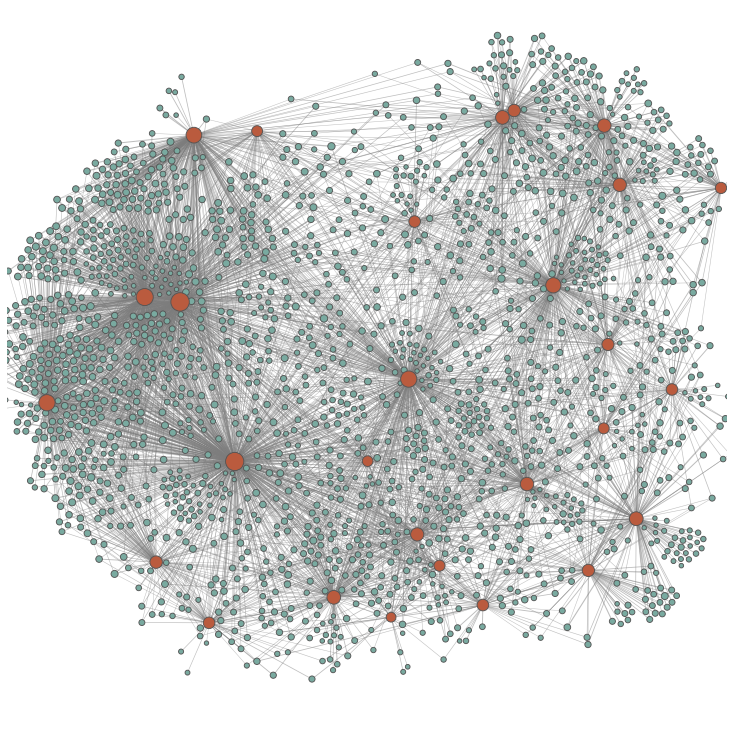

In [218]:
# Sofies test
# get all topics and persons - the node in the bipartite network
all_topics = list(HSBM_probs_topics.columns)[4:]
all_pers = HSBM_probs_topics['name']
# Make list of link sets
link_set = [(pers, topic) for pers in all_pers for topic in all_topics if y[topic][pers]!=0]

# Dict with edge weights 
link_weights = {(pers, topic):y[topic][pers] for pers in all_pers for topic in all_topics if y[topic][pers]!=0}

# Create network
G_bi=nx.Graph()
G_bi.add_nodes_from(all_pers,bipartite=0)
G_bi.add_nodes_from(all_topics,bipartite=1)
G_bi.add_edges_from(link_set)

# #Set weights 
nx.set_edge_attributes(G_bi, link_weights, name = "weight")

# Node attributes
node_attr = {n:d["bipartite"] for n,d in G_bi.nodes(data=True)}
nx.set_node_attributes(G_bi, node_attr, name="group")

network, config = nw.visualize(G_bi, plot_in_cell_below=False)
fig, ax = nw.draw_netwulf(network, figsize = 10)

In [222]:
HSBM_probs_topics

,name,discipline,community,text,Mathematical Models,Value interests,Society and history,Philosophy,International Relations,Domestic Politics,Justice,Cultural Sociology,The Mind of the Individual,Human actions,Psychoanalysis,Stories of minorities,Science Studies,Capitalism,War and Conflicts,Language and Religion,Power relations and Class,Race,Economics,Child/mother relations,Global relations -Asia,Equal Rights,Financial Polics,Democratic Policy Making,Cognition and behaviour,Gender,Marxism,Psychology
0,A. H. J. Prins,anth,1,"['adriaan', 'hendrik', 'johan', 'generally', '...",0.010558,0.012066,0.110106,0.009050,0.030166,0.016591,0.009050,0.018100,0.015083,0.019608,0.010558,0.028658,0.015083,0.003017,0.013575,0.010558,0.003017,0.007541,0.001508,0.006033,0.004525,0.001508,0.003017,0.001508,0.000000,0.000000,0.000000,0.000000
1,Adam Kuper,anth,1,"['adam', 'jonathan', 'born', 'december', '1941...",0.000000,0.003448,0.100000,0.006897,0.010345,0.003448,0.006897,0.020690,0.006897,0.013793,0.000000,0.013793,0.020690,0.013793,0.003448,0.003448,0.000000,0.013793,0.003448,0.006897,0.003448,0.003448,0.003448,0.000000,0.000000,0.000000,0.000000,0.000000
2,Alan Macfarlane,anth,6,"['alan', 'donald', 'born', 'december', '1941',...",0.000908,0.004541,0.043597,0.019982,0.009083,0.002725,0.009083,0.006358,0.006358,0.019074,0.000000,0.007266,0.018165,0.009991,0.006358,0.006358,0.000000,0.006358,0.002725,0.015441,0.026340,0.001817,0.001817,0.001817,0.001817,0.001817,0.006358,0.000000
3,Albert Buell Lewis,anth,1,"['june', '1867', '–', 'october', '1940', 'firs...",0.010782,0.001348,0.090296,0.013477,0.004043,0.000000,0.005391,0.010782,0.010782,0.018868,0.002695,0.080863,0.006739,0.005391,0.002695,0.005391,0.001348,0.002695,0.000000,0.014825,0.001348,0.002695,0.001348,0.000000,0.004043,0.000000,0.001348,0.000000
4,Alfred Gell,anth,1,"['alfred', 'antony', 'francis', 'june', '1945'...",0.003145,0.006289,0.069182,0.015723,0.000000,0.000000,0.000000,0.012579,0.022013,0.044025,0.000000,0.012579,0.018868,0.006289,0.003145,0.100629,0.003145,0.006289,0.009434,0.015723,0.009434,0.003145,0.000000,0.000000,0.006289,0.000000,0.000000,0.000000
5,Anthony F. C. Wallace,anth,1,"['anthony', 'francis', 'clarke', 'april', '192...",0.001590,0.001590,0.077901,0.011129,0.030207,0.006359,0.000000,0.011129,0.012719,0.014308,0.001590,0.025437,0.020668,0.004769,0.009539,0.014308,0.001590,0.011129,0.001590,0.006359,0.001590,0.000000,0.000000,0.000000,0.004769,0.001590,0.001590,0.007949
6,Anton Blok,anth,1,"['born', '1935', 'amsterdam', 'dutch', 'anthro...",0.000000,0.018692,0.018692,0.000000,0.009346,0.000000,0.009346,0.009346,0.018692,0.009346,0.018692,0.000000,0.009346,0.009346,0.018692,0.018692,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.009346,0.000000,0.000000,0.009346,0.000000
7,Arthur Maurice Hocart,anth,5,"['april', '1883', 'etterbeek', 'belgium', '–',...",0.003876,0.001938,0.100775,0.025194,0.003876,0.005814,0.005814,0.009690,0.003876,0.015504,0.001938,0.027132,0.011628,0.001938,0.009690,0.005814,0.001938,0.011628,0.000000,0.015504,0.001938,0.009690,0.005814,0.001938,0.005814,0.000000,0.003876,0.001938
8,Arturo Escobar (anthropologist),anth,5,"['born', '1952', 'colombianamerican', 'anthrop...",0.004637,0.004637,0.021638,0.006182,0.034003,0.007728,0.003091,0.010819,0.001546,0.010819,0.000000,0.012365,0.038640,0.006182,0.010819,0.020093,0.020093,0.007728,0.003091,0.003091,0.007728,0.001546,0.004637,0.017002,0.000000,0.001546,0.007728,0.000000
9,Ashley Montagu,anth,1,"['montague', 'francis', 'ashley1905', '–', '19...",0.006584,0.003292,0.026337,0.057613,0.013992,0.001646,0.008230,0.014815,0.015638,0.032922,0.000000,0.023868,0.010700,0.001646,0.008230,0.000000,0.001646,0.036214,0.000823,0.016461,0.000823,0.004938,0.002469,0.001646,0.009053,0.009053,0.000823,0.001646


(<Figure size 288x288 with 1 Axes>, <Axes:>)

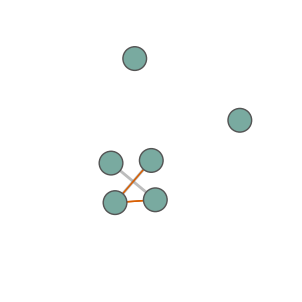

In [265]:
G = nx.Graph()
G.add_nodes_from([0,1,2,'a','b','c'])
G.add_edges_from([(0,1),('a','b')])

# network, config = nw.visualize(G,config={'zoom':3})

# draw links only at first
fig, ax = nw.draw_netwulf(network,draw_nodes=False)

# get positions of two unconnected nodes to draw a link anyway
v0 = nw.node_pos(network, 'a')
v1 = nw.node_pos(network, 1)
ax.plot([v0[0],v1[0]],[v0[1],v1[1]],c='#d95f02')
v2 = nw.node_pos(network, 0)
v3 = nw.node_pos(network, 1)
ax.plot([v2[0],v3[0]],[v2[1],v3[1]], [v0[0],v1[0]],[v0[1],v1[1]],c='#d95f02')
# draw nodes now
nw.draw_netwulf(network,fig,ax,draw_links=False)


In [260]:
v0

(339.02750267172087, 186.92392455890808)